In [1]:
import pandas as pd
import numpy as np
import os

In [51]:
data.nome_partido.unique()

array(['NOVO', 'PT', 'MDB', 'PSB', 'DEM', 'PCDOB', 'PR', 'PDT', 'PPS',
       'SD', 'PSOL', 'PSDB', 'PP', 'PROS', 'PSL', 'PSD', 'PSoL', 'PTB',
       'PSC', 'PODEMOS', 'PRB', 'PODE', 'PHS', 'PRP', 'SOLIDARIEDADE',
       'PV', 'PATRIOTA', 'AVANTE', 'PMN', 'REDE'], dtype=object)

In [2]:
data = pd.read_csv('data.csv',sep=';')

In [3]:
data

,Unnamed: 0,id_tweet,isFavorable,id_politico,text,time,nome_principal,twitter,classe politica,nome_partido,estado,regiao
0,0,34,1,5,Estive hoje com um dos maiores especialistas e...,2019-01-30 00:31:08,ADRIANA VENTURA,adrianasounovo,deputado federal,NOVO,SÃO PAULO,SUDESTE
1,1,42,-1,8,Reforma de Bolsonaro massacra mulheres! #contr...,2019-02-27 13:49:51,AFONSO FLORENCE,AfonsoFlorence,deputado federal,PT,BAHIA,NORDESTE
2,2,43,-1,8,Ministro da educação não tem condição de conti...,2019-02-26 15:33:26,AFONSO FLORENCE,AfonsoFlorence,deputado federal,PT,BAHIA,NORDESTE
3,3,46,-1,8,O governo Bolsonaro não tem mais condição polí...,2019-02-20 17:39:41,AFONSO FLORENCE,AfonsoFlorence,deputado federal,PT,BAHIA,NORDESTE
4,4,47,-1,8,Reforma da Previdência de Bolsonaro é muito pi...,2019-02-20 14:40:52,AFONSO FLORENCE,AfonsoFlorence,deputado federal,PT,BAHIA,NORDESTE
...,...,...,...,...,...,...,...,...,...,...,...,...
12195,12195,296165,-1,502,"O que está em votação na Câmara, além da destr...",2019-07-11 13:17:23,WALDENOR PEREIRA,waldenorpereira,deputado federal,PT,BAHIA,NORDESTE
12196,12196,296167,-1,502,"A reforma da Previdência não é o ""passe de mág...",2019-07-11 13:14:15,WALDENOR PEREIRA,waldenorpereira,deputado federal,PT,BAHIA,NORDESTE
12197,12197,296169,-1,509,"Melhor ilustração que já li, de autoria do esc...",2019-07-11 15:21:19,ZÉ CARLOS,dep_zecarlospt,deputado federal,PT,MARANHÃO,NORDESTE
12198,12198,296175,-1,513,Maioria das mulheres é contra a reforma da pre...,2019-07-11 13:40:00,ZECA DIRCEU,zeca_dirceu,deputado federal,PT,Parana,Sul


In [78]:
def H(L_taus, how='mean', alfa=0.025):
    if len(L_taus) == 0:
        return 0
    if how == 'mean':
        return np.mean(L_taus)
    if how == 'max':
        return max(L_taus)
    if how == 'min':
        return min(L_taus)
    if how == 'last':
        return L_taus[-1]
    if how == 'first':
        return L_taus[0]
    if how == 'exp':
        smoothed_value = L_taus[0]
        for tau in L_taus[1:]:
            smoothed_value = alfa * tau + (1 - alfa) * smoothed_value
        return smoothed_value

In [16]:
delta=0.25

In [17]:
class Politico:
    pass
info=[]
for id_politico in data.id_politico.unique():
    data_now = data.loc[data.id_politico==id_politico].set_index('time').iloc[:,2:]
    data_now = data_now[~data_now.index.duplicated(keep='first')]
    
    politico = Politico()
    
    politico.id = id_politico
    politico.taus = data_now.isFavorable
    politico.scores = [H(politico.taus[:i],'last') for i in range(len(politico.taus))]
    info.append(politico)


In [18]:
intm = [pd.DataFrame(x.scores,index = pd.to_datetime(x.taus.index.values),columns=[x.id]) for x in info]
intm = [x.groupby(x.index.date).mean() for x in intm]

In [19]:
df_scores = pd.concat(intm,axis=1)
df_scores.iloc[0] = 0
df_scores = df_scores.fillna(method='ffill').sort_index()

In [20]:
#df_scores.plot(figsize=(14,7),grid=True, legend=False)

In [21]:
def contar_valores(row, delta):
    maior = (row > delta).sum()
    menor = (row < -delta).sum()
    entre = ((row >= -delta) & (row <= delta)).sum()
    return pd.Series({'Λ': maior, 'Ω': menor, 'K': entre})

def classify(df_score,delta=0.25):
    count = df_score.apply(lambda row: contar_valores(row, delta), axis=1)

    return count

<Axes: title={'center': 'δ = 0.05'}>

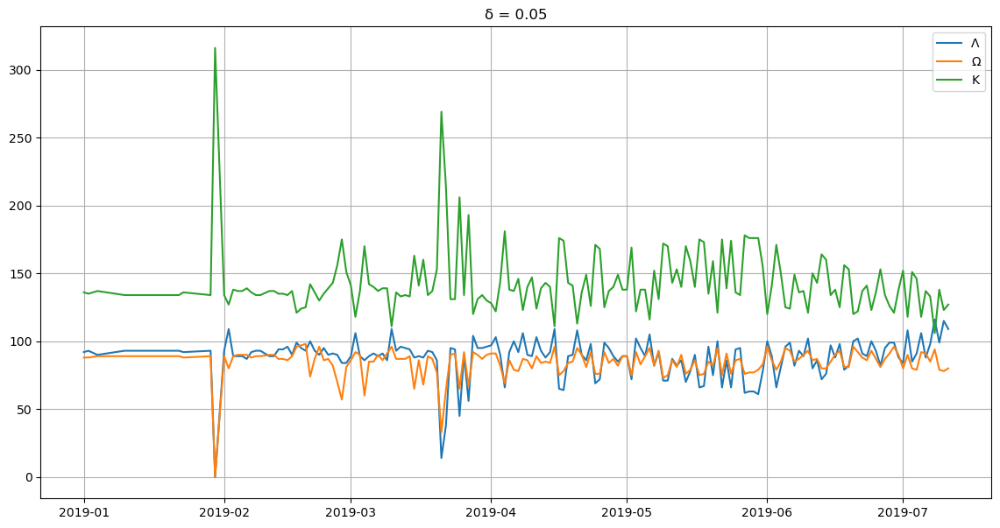

In [22]:
delta = 0.05
classify(df_scores,delta).plot(figsize=(14,7),grid=True,title='δ = %s'%delta)

In [46]:
classify(df_scores,delta)

,Λ,Ω,K
2019-01-01,93,91,132
2019-01-02,93,91,132
2019-01-04,94,91,131
2019-01-10,93,91,132
2019-01-11,93,90,133
...,...,...,...
2019-07-07,101,90,125
2019-07-08,109,93,114
2019-07-09,95,86,135
2019-07-10,100,86,130


In [24]:
### LAG ###

In [29]:
import seaborn as sns
sns.set()

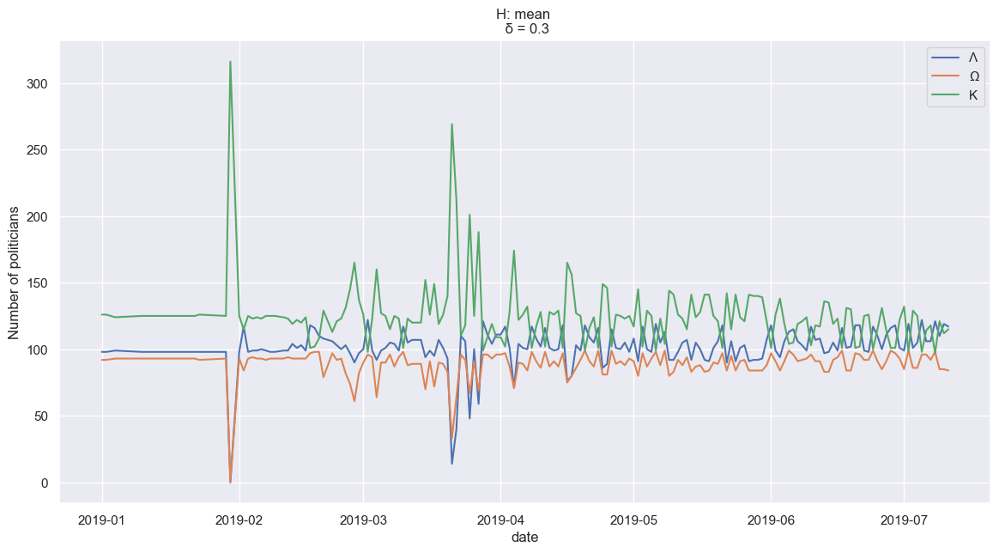

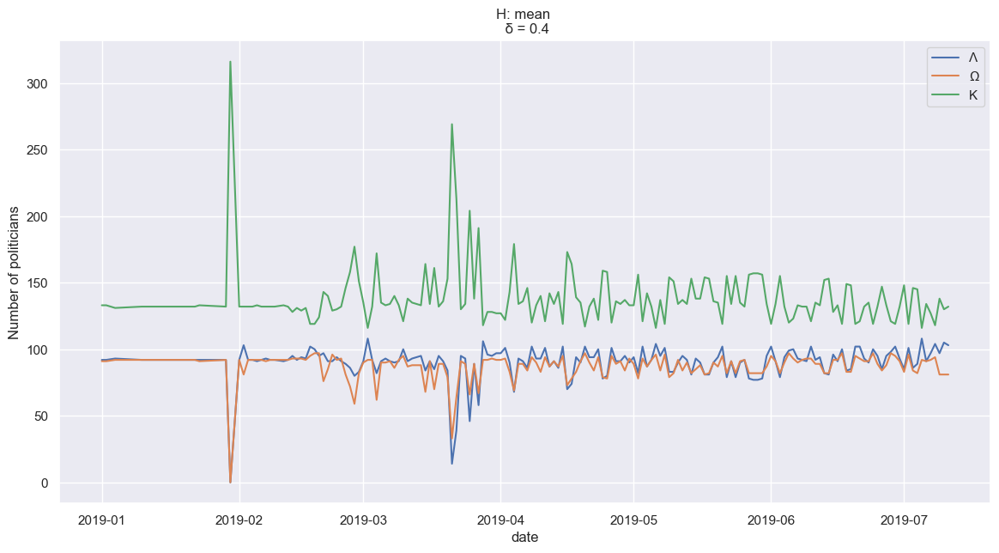

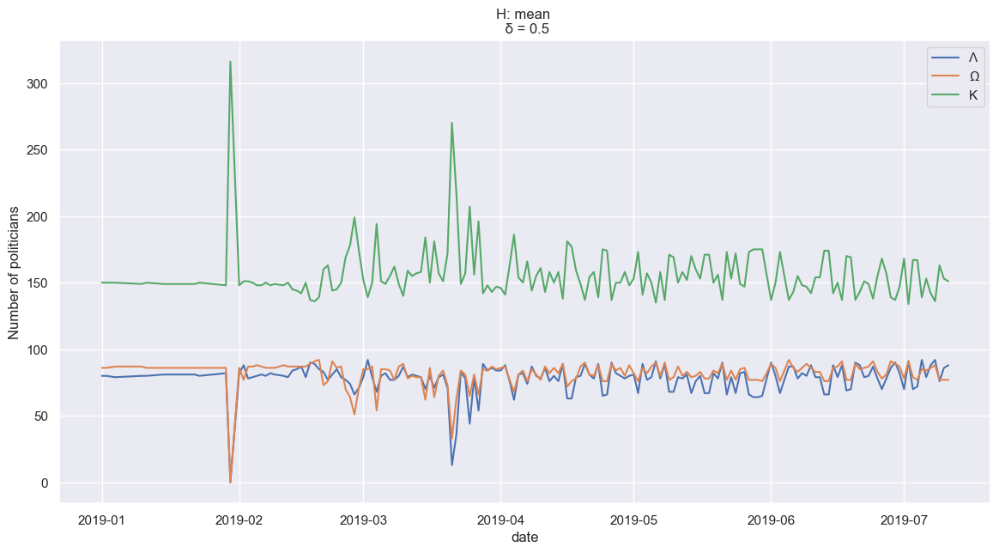

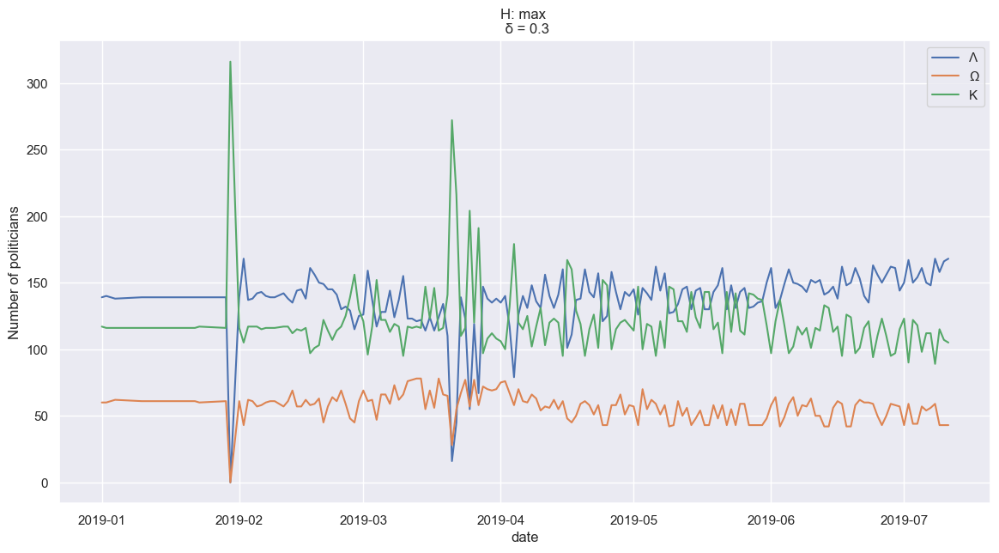

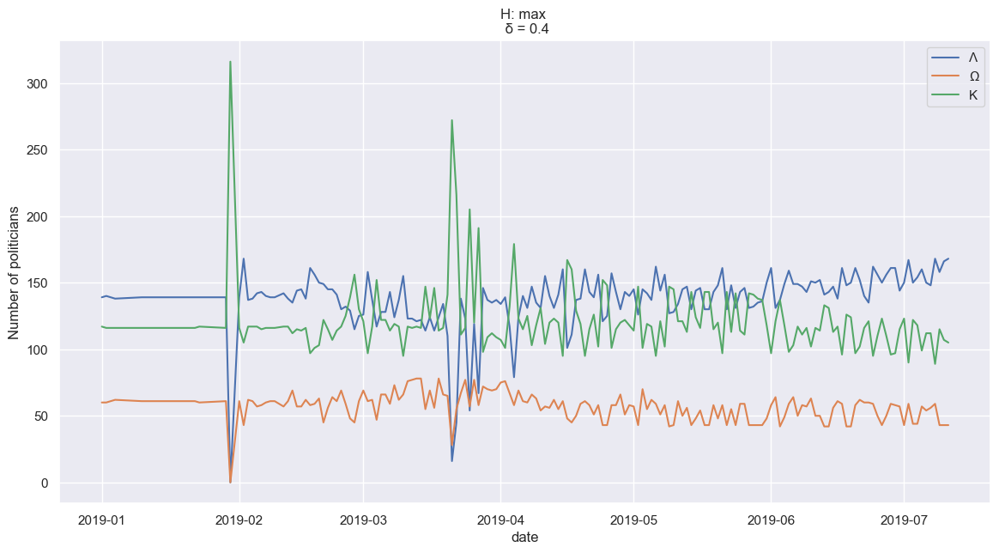

...

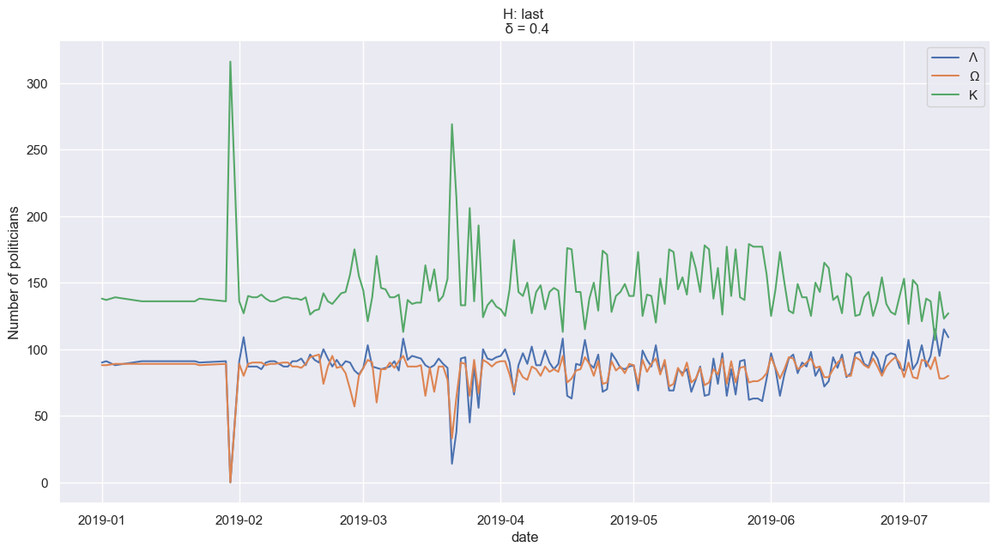

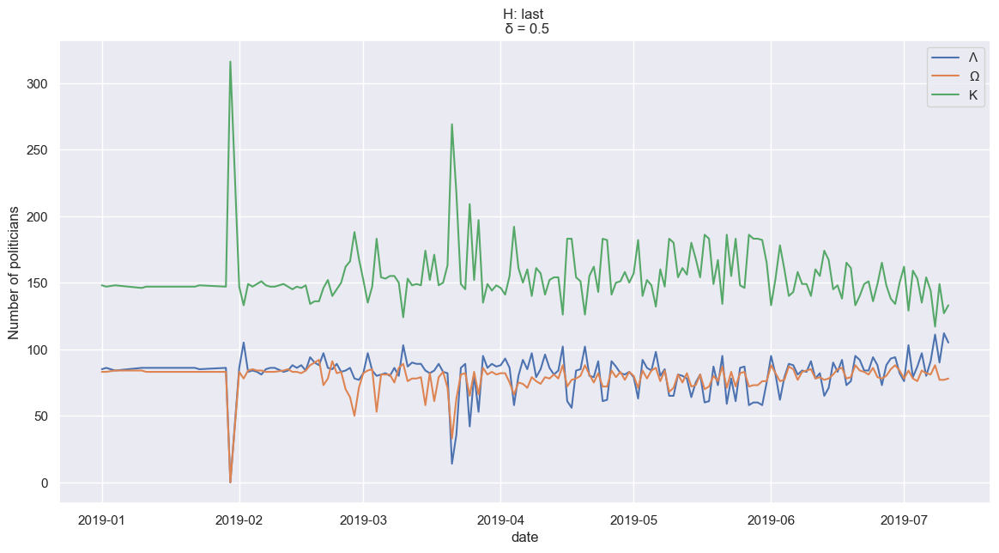

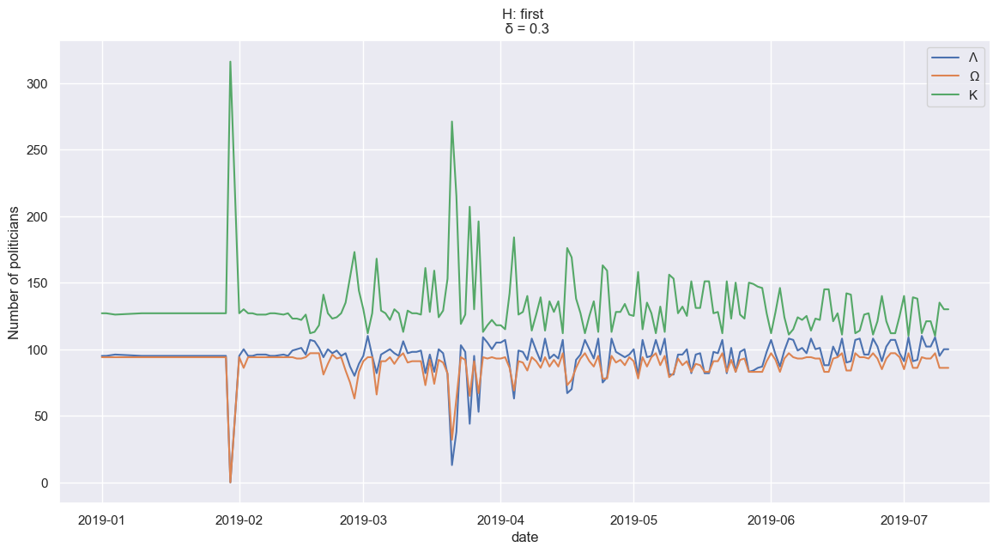

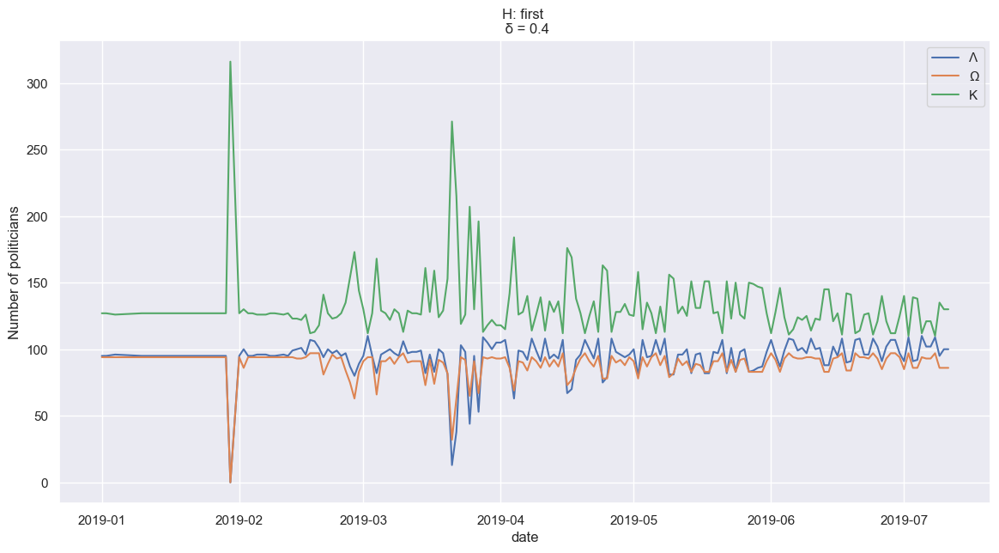

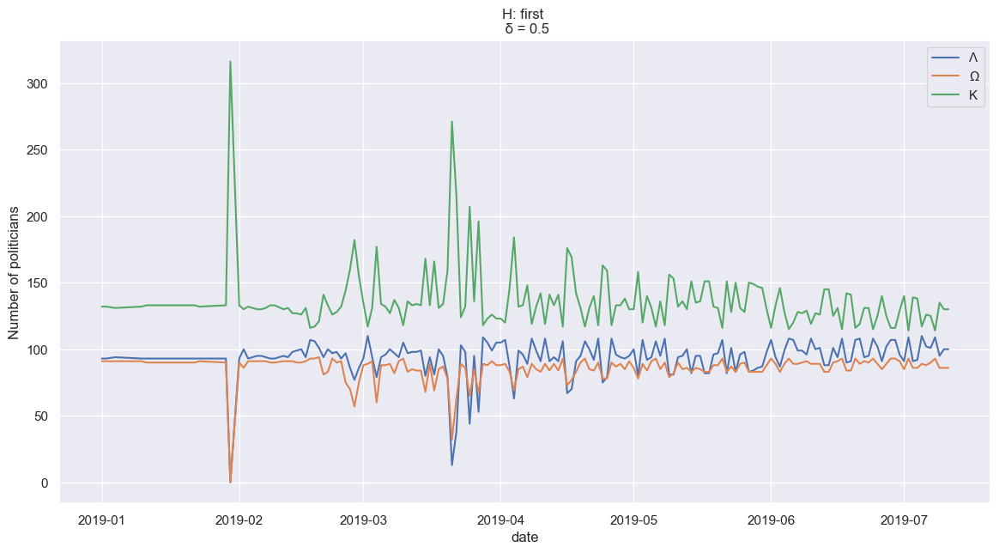

In [35]:
for method in ['mean','max','min','last','first']:
    class Politico:
        pass
    info=[]
    for id_politico in data.id_politico.unique():
        data_now = data.loc[data.id_politico==id_politico].set_index('time').iloc[:,2:]
        data_now = data_now[~data_now.index.duplicated(keep='first')]

        politico = Politico()

        politico.id = id_politico
        politico.taus = data_now.isFavorable
        politico.scores = [H(politico.taus[:i],method) for i in range(len(politico.taus))]
        info.append(politico)


    intm = [pd.DataFrame([0]+x.scores[1:],index = pd.to_datetime(x.taus.index.values),columns=[x.id]) for x in info]
    intm = [x.groupby(x.index.date).mean() for x in intm]

    df_scores = pd.concat(intm,axis=1)
    df_scores.iloc[0] = 0
    df_scores = df_scores.fillna(method='ffill').sort_index()
    

    for delta in [0.3,0.4,0.5]:
        ax = classify(df_scores,delta).plot(figsize=(14,7),grid=True,title="H: %s \n δ = %s"%(method,delta))
        ax.set_xlabel("date")
        ax.set_ylabel("Number of politicians")

In [40]:
import matplotlib.pyplot as plt

HmeanD03.png
HmeanD04.png
HmeanD05.png
HexpD03.png
HexpD04.png
HexpD05.png
HlastD03.png
HlastD04.png
HlastD05.png


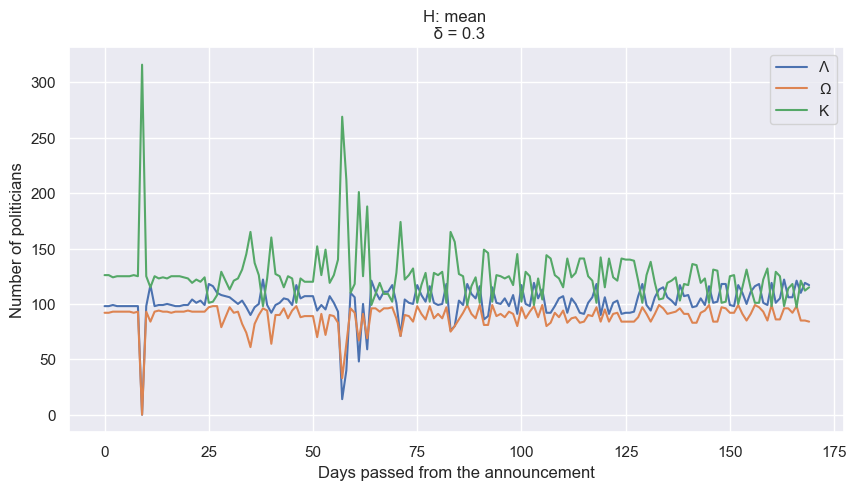

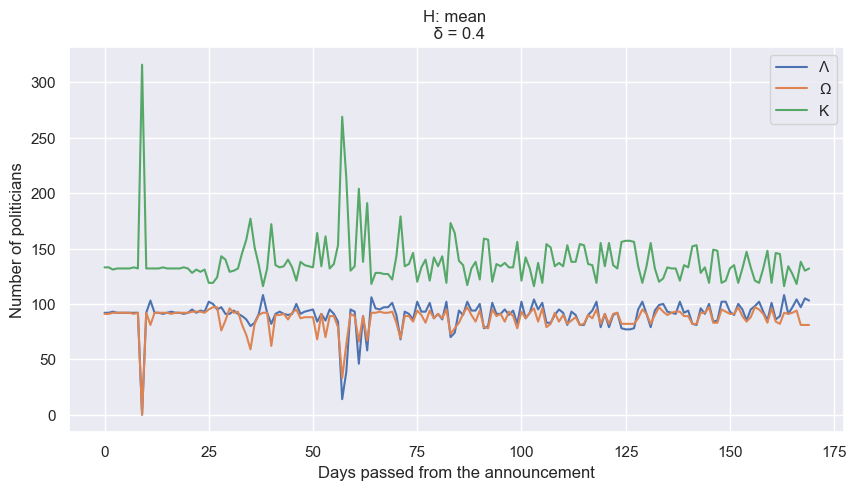

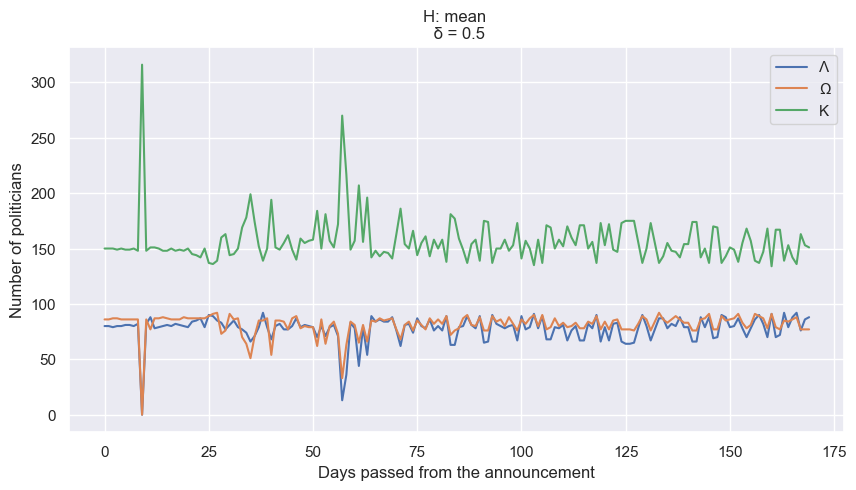

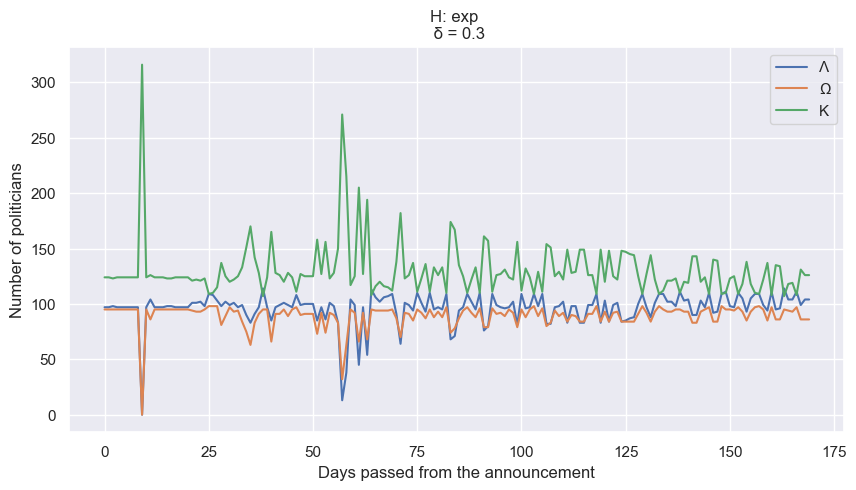

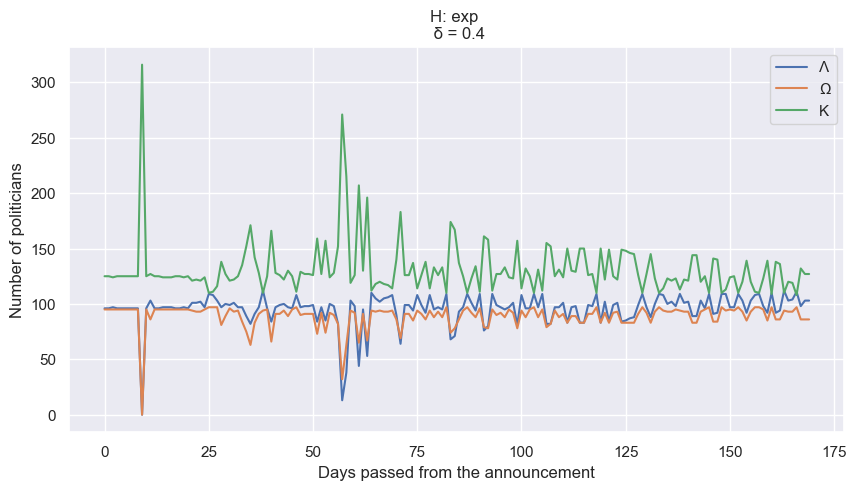

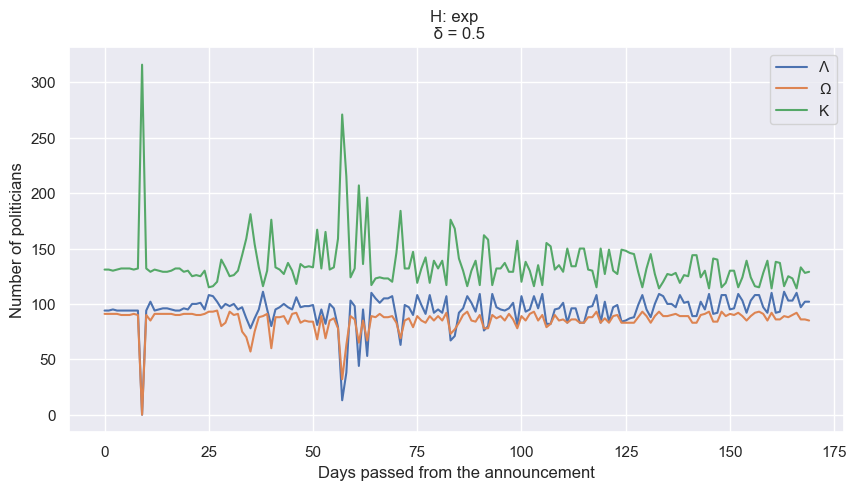

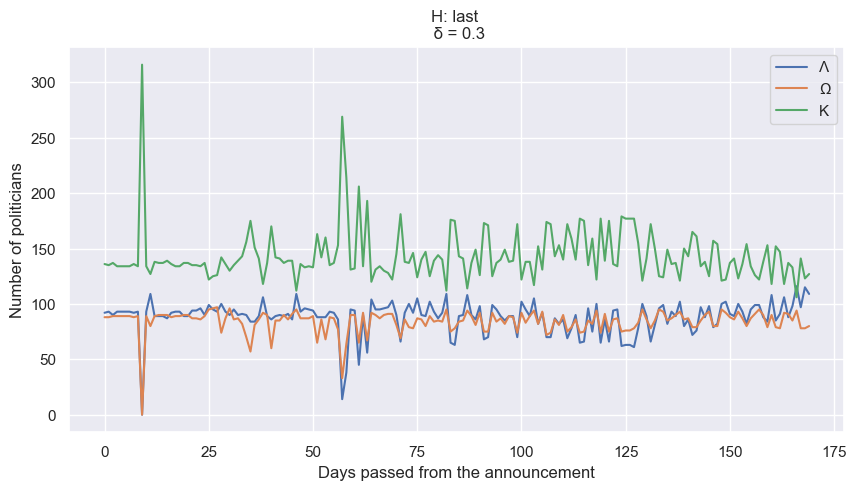

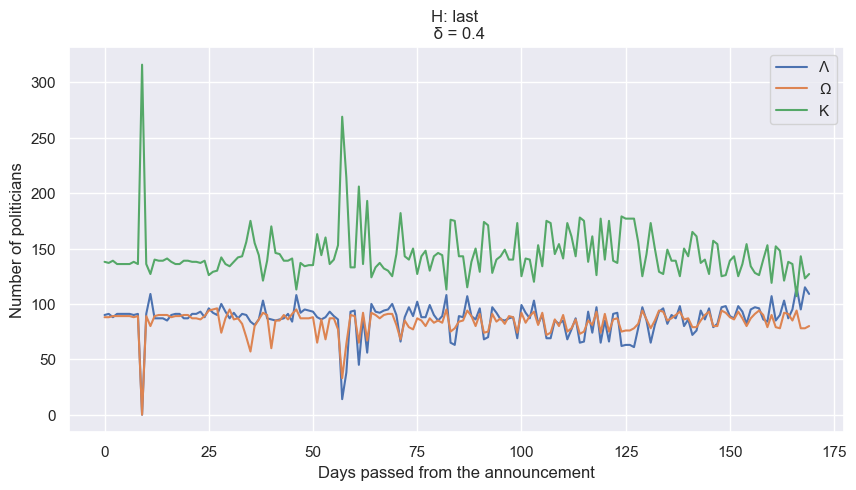

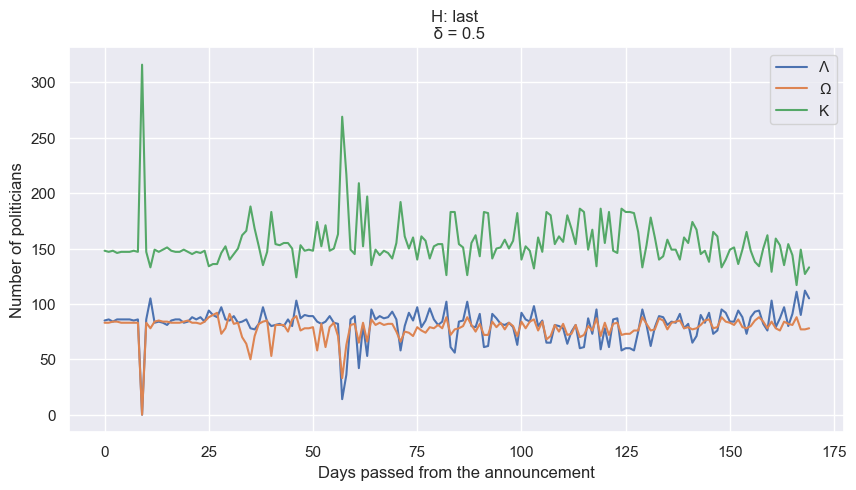

In [79]:
for method in ['mean','exp','last']:
    class Politico:
        pass
    info=[]
    for id_politico in data.id_politico.unique():
        data_now = data.loc[data.id_politico==id_politico].set_index('time').iloc[:,2:]
        data_now = data_now[~data_now.index.duplicated(keep='first')]

        politico = Politico()

        politico.id = id_politico
        politico.taus = data_now.isFavorable
        politico.scores = [H(politico.taus[:i],method) for i in range(len(politico.taus))]
        info.append(politico)


    intm = [pd.DataFrame([0]+x.scores[1:],index = pd.to_datetime(x.taus.index.values),columns=[x.id]) for x in info]
    intm = [x.groupby(x.index.date).mean() for x in intm]

    df_scores = pd.concat(intm,axis=1)
    df_scores.iloc[0] = 0
    df_scores = df_scores.fillna(method='ffill').sort_index()
    

    for delta in [0.3,0.4,0.5]:
        ax = classify(df_scores,delta).reset_index().iloc[:,1:].plot(figsize=(10,5),grid=True,title="H: %s \n δ = %s"%(method,delta))
        ax.set_xlabel("Days passed from the announcement")
        ax.set_ylabel("Number of politicians")
        filename = "H%sD%s.png" % (method,str(delta).replace('.',''))
        plt.savefig(os.path.join(r'images',filename))
        print(filename)

HmeanD03 - Partido NOVO.png
HmeanD04 - Partido NOVO.png
HmeanD05 - Partido NOVO.png
HexpD03 - Partido NOVO.png
HexpD04 - Partido NOVO.png
HexpD05 - Partido NOVO.png
HlastD03 - Partido NOVO.png
HlastD04 - Partido NOVO.png
HlastD05 - Partido NOVO.png
HmeanD03 - Partido PT.png
HmeanD04 - Partido PT.png
HmeanD05 - Partido PT.png
HexpD03 - Partido PT.png
HexpD04 - Partido PT.png
HexpD05 - Partido PT.png
HlastD03 - Partido PT.png
HlastD04 - Partido PT.png
HlastD05 - Partido PT.png
HmeanD03 - Partido MDB.png
HmeanD04 - Partido MDB.png


/Users/heitorbuenoponchioxavier/anaconda3/lib/python3.10/site-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


HmeanD05 - Partido MDB.png
HexpD03 - Partido MDB.png
HexpD04 - Partido MDB.png
HexpD05 - Partido MDB.png
HlastD03 - Partido MDB.png
HlastD04 - Partido MDB.png
HlastD05 - Partido MDB.png
HmeanD03 - Partido PSOL.png
HmeanD04 - Partido PSOL.png
HmeanD05 - Partido PSOL.png
HexpD03 - Partido PSOL.png
HexpD04 - Partido PSOL.png
HexpD05 - Partido PSOL.png
HlastD03 - Partido PSOL.png
HlastD04 - Partido PSOL.png
HlastD05 - Partido PSOL.png
HmeanD03 - Partido PSDB.png
HmeanD04 - Partido PSDB.png
HmeanD05 - Partido PSDB.png
HexpD03 - Partido PSDB.png
HexpD04 - Partido PSDB.png
HexpD05 - Partido PSDB.png
HlastD03 - Partido PSDB.png
HlastD04 - Partido PSDB.png
HlastD05 - Partido PSDB.png
HmeanD03 - Partido PP.png
HmeanD04 - Partido PP.png
HmeanD05 - Partido PP.png
HexpD03 - Partido PP.png
HexpD04 - Partido PP.png
HexpD05 - Partido PP.png
HlastD03 - Partido PP.png
HlastD04 - Partido PP.png
HlastD05 - Partido PP.png
HmeanD03 - Partido PROS.png
HmeanD04 - Partido PROS.png
HmeanD05 - Partido PROS.png
H

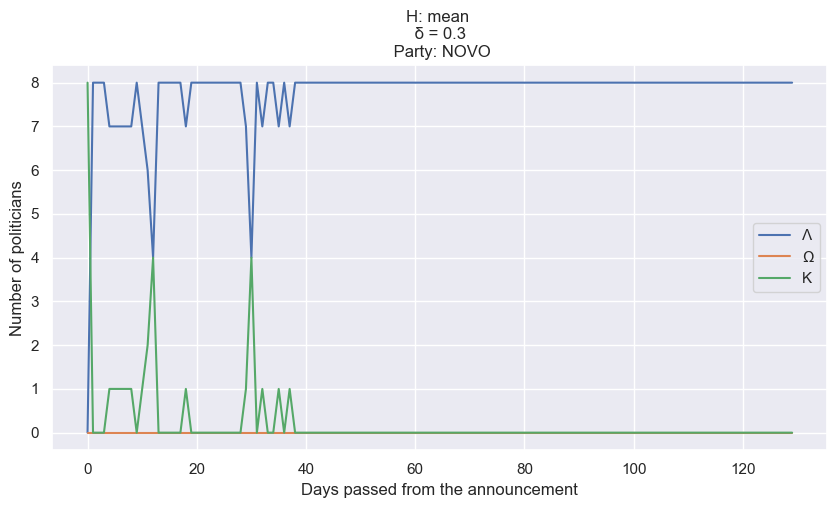

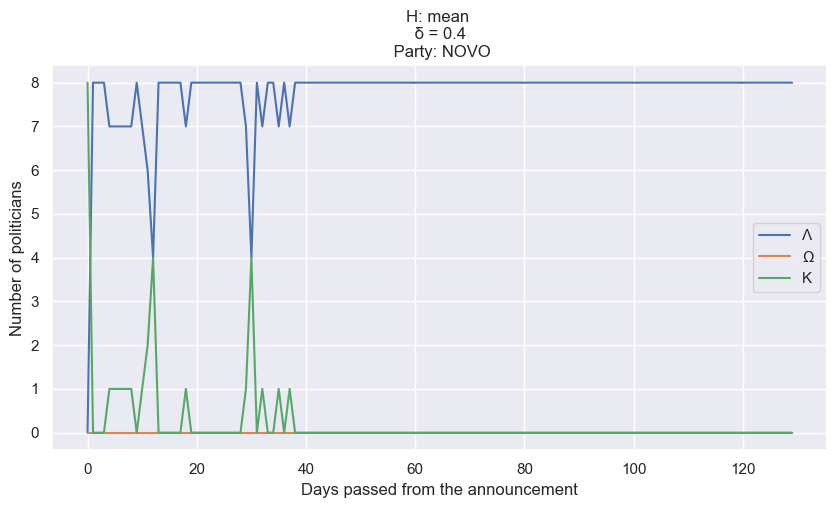

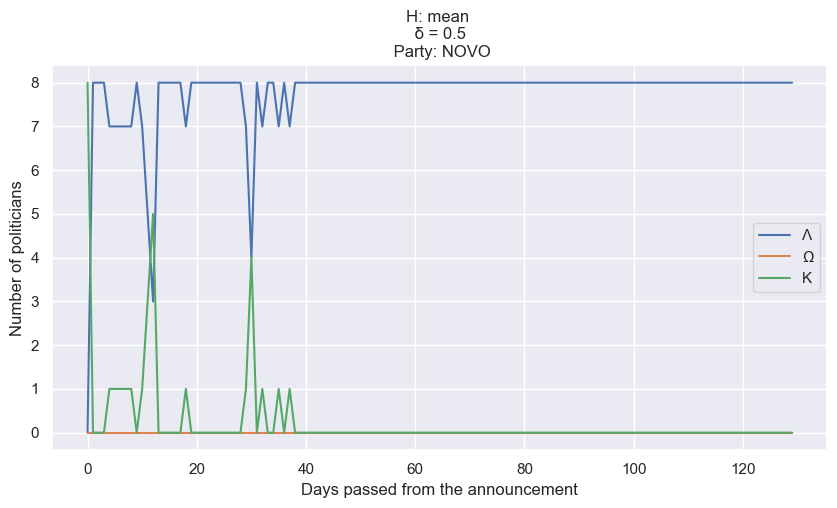

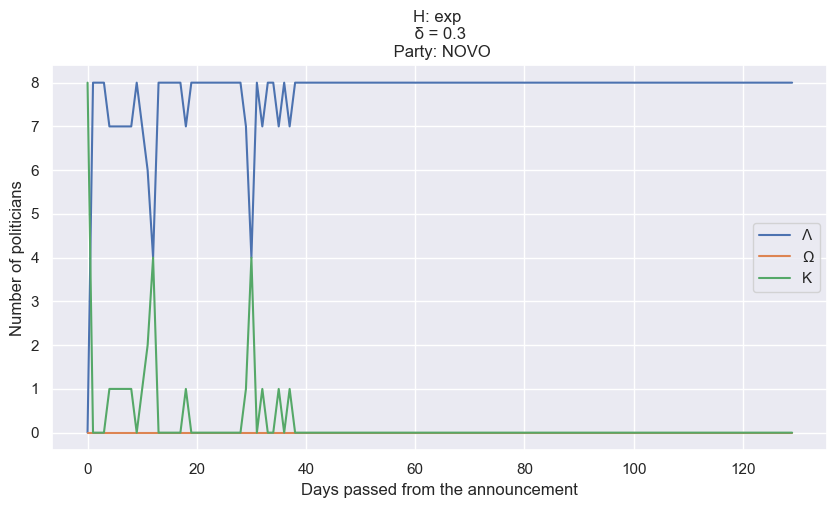

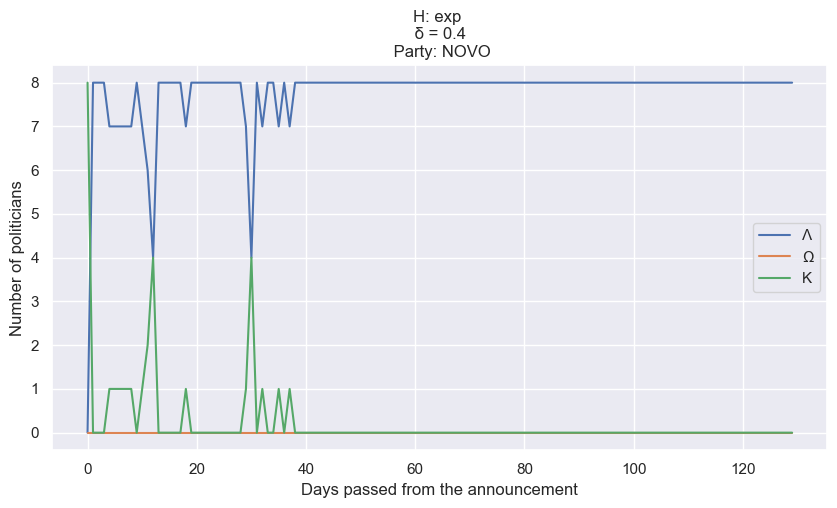

...

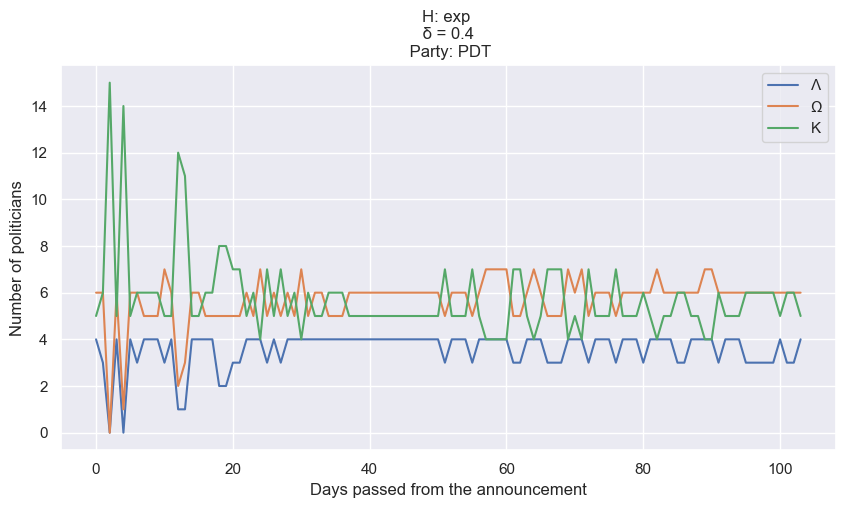

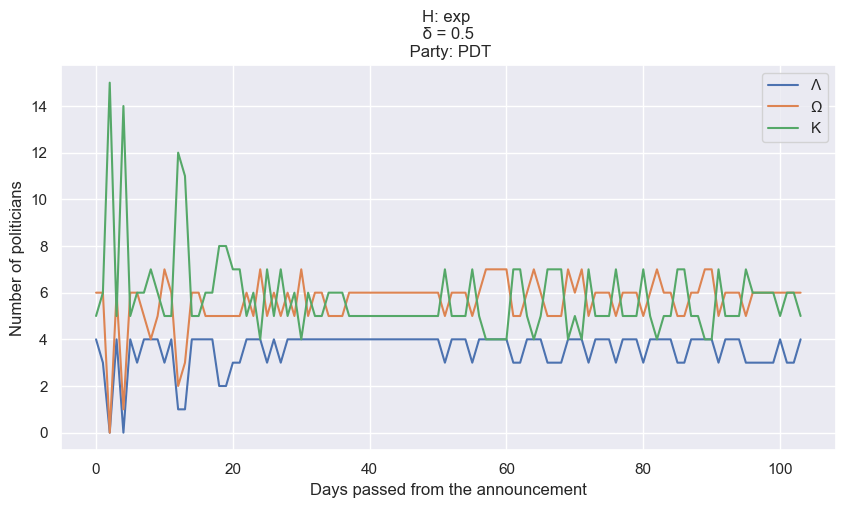

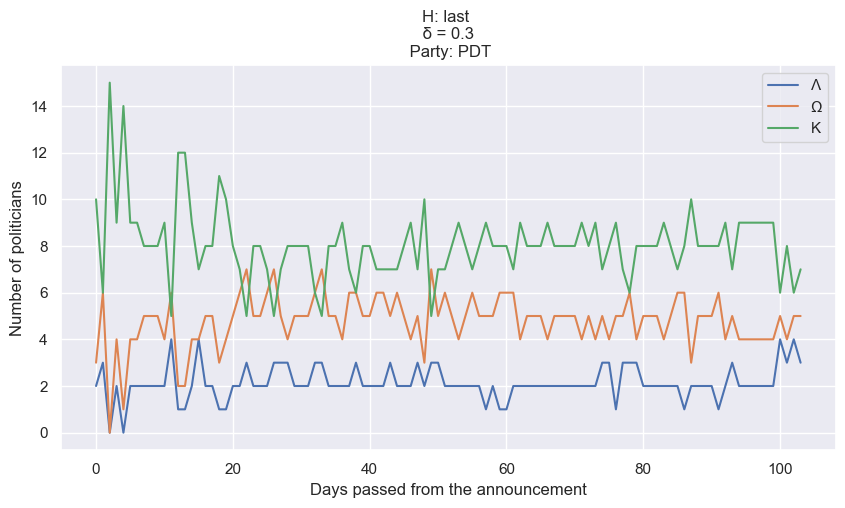

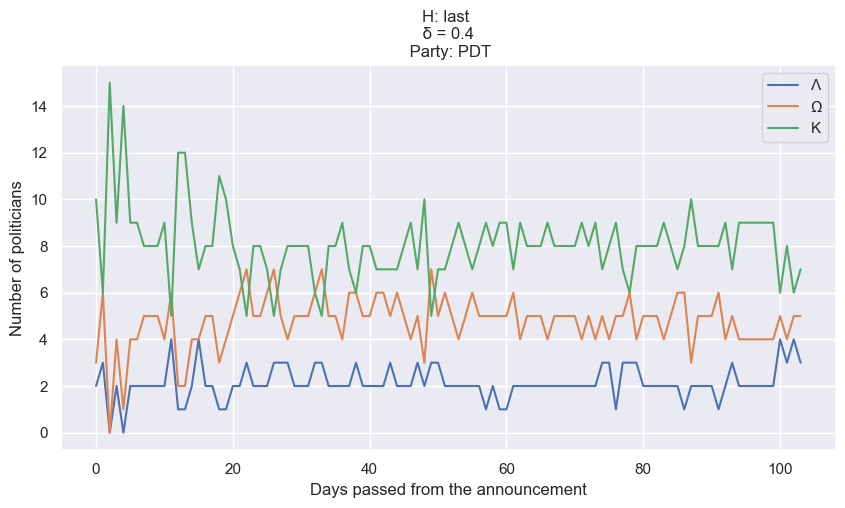

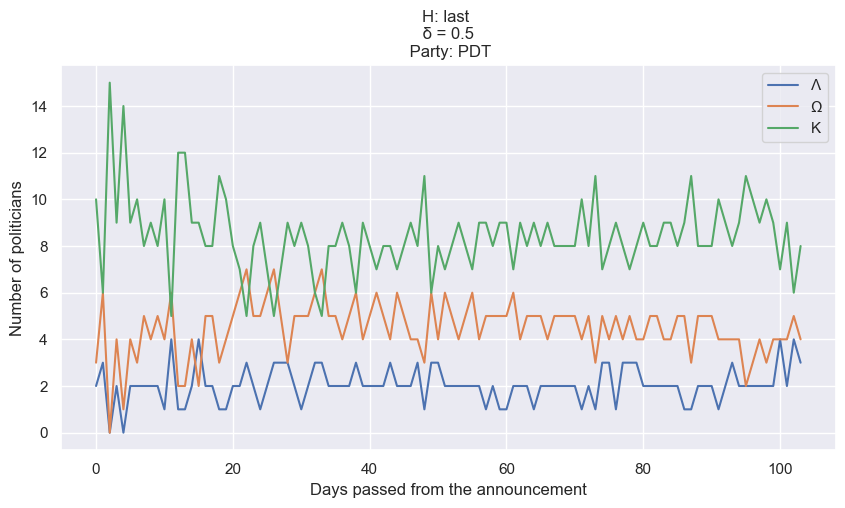

In [81]:
for partido_now in ['NOVO', 'PT', 'MDB','PSOL', 'PSDB', 'PP', 'PROS', 'PSL','PDT']:
    for method in ['mean','exp','last']:
        class Politico:
            pass
        info=[]
        for id_politico in data.id_politico.unique():
            data_now = data.copy().loc[data.id_politico==id_politico].set_index('time').iloc[:,2:]
            data_now = data_now[~data_now.index.duplicated(keep='first')]
            data_now = data_now.loc[data_now.nome_partido==partido_now]
            #data_now = data.copy().loc[data.nome_partido==partido_now]
            if len(data_now)==0:
                continue

            politico = Politico()

            politico.id = id_politico
            politico.taus = data_now.isFavorable
            politico.scores = [H(politico.taus[:i],method) for i in range(len(politico.taus))]
            info.append(politico)


        intm = [pd.DataFrame([0]+x.scores[1:],index = pd.to_datetime(x.taus.index.values),columns=[x.id]) for x in info]
        intm = [x.groupby(x.index.date).mean() for x in intm]

        df_scores = pd.concat(intm,axis=1)
        df_scores.iloc[0] = 0
        df_scores = df_scores.fillna(method='ffill').sort_index()


        for delta in [0.3,0.4,0.5]:
            ax = classify(df_scores,delta).reset_index().iloc[:,1:].plot(figsize=(10,5),
                                                                         grid=True,
                                                                         title="H: %s \n δ = %s \n Party: %s"%(method,delta,partido_now))
            ax.set_xlabel("Days passed from the announcement")
            ax.set_ylabel("Number of politicians")
            filename = "H%sD%s - Partido %s.png" % (method,str(delta).replace('.',''),partido_now)
            plt.savefig(os.path.join(r'images',filename))
            print(filename)

In [82]:
data.nome_partido.unique()

array(['NOVO', 'PT', 'MDB', 'PSB', 'DEM', 'PCDOB', 'PR', 'PDT', 'PPS',
       'SD', 'PSOL', 'PSDB', 'PP', 'PROS', 'PSL', 'PSD', 'PSoL', 'PTB',
       'PSC', 'PODEMOS', 'PRB', 'PODE', 'PHS', 'PRP', 'SOLIDARIEDADE',
       'PV', 'PATRIOTA', 'AVANTE', 'PMN', 'REDE'], dtype=object)

In [ ]:
Progressistas, Republicanos, Solidariedade, PL e PTB, e frequentemente parlamentares do PSD, DEM, MDB, PROS, PSC, Avante e Patriota.

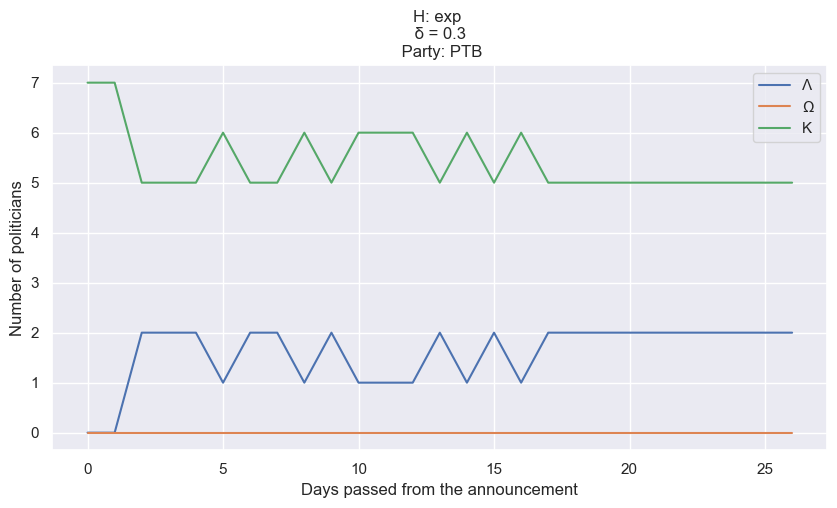

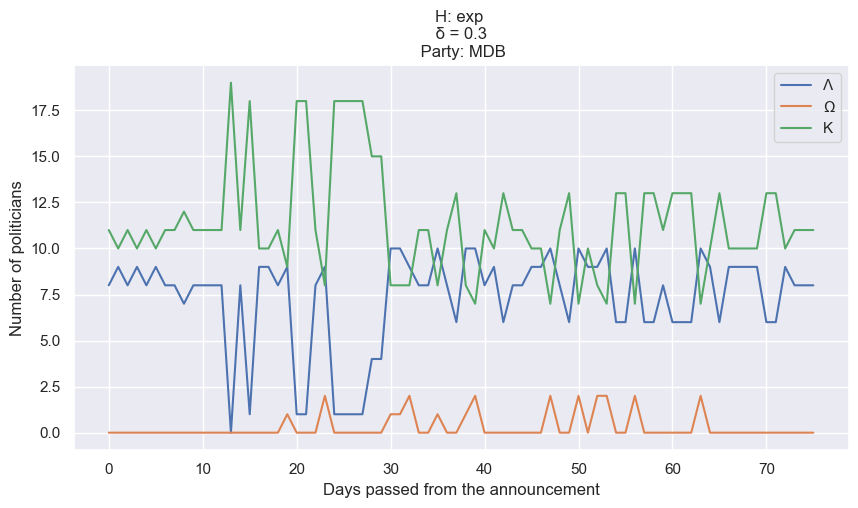

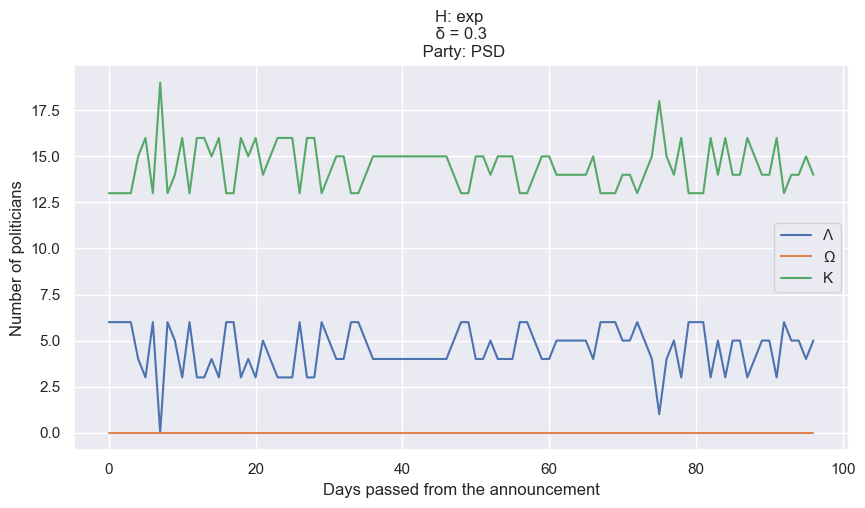

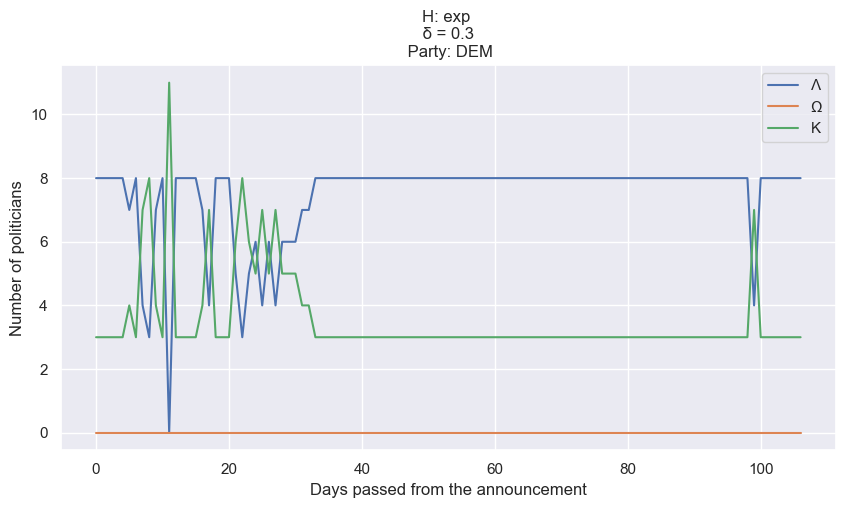

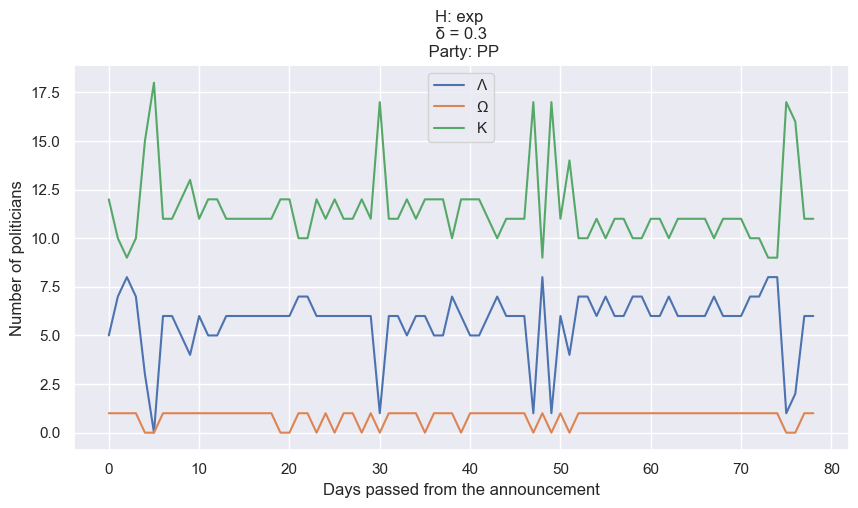

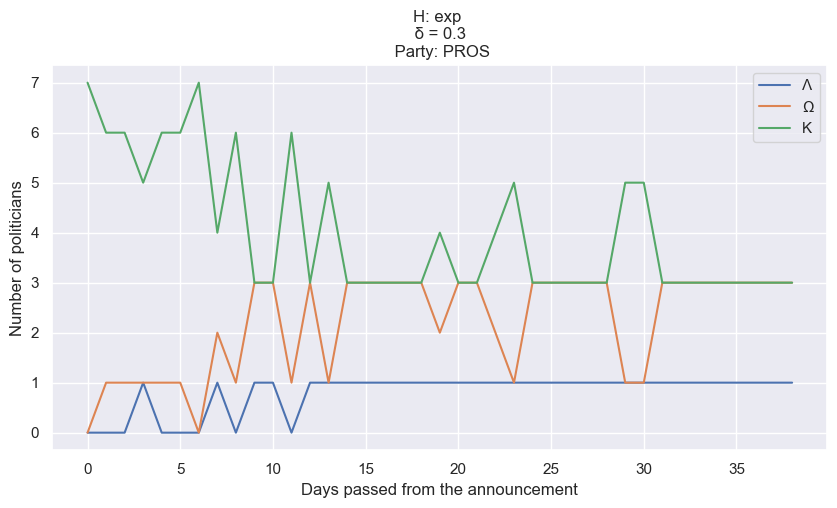

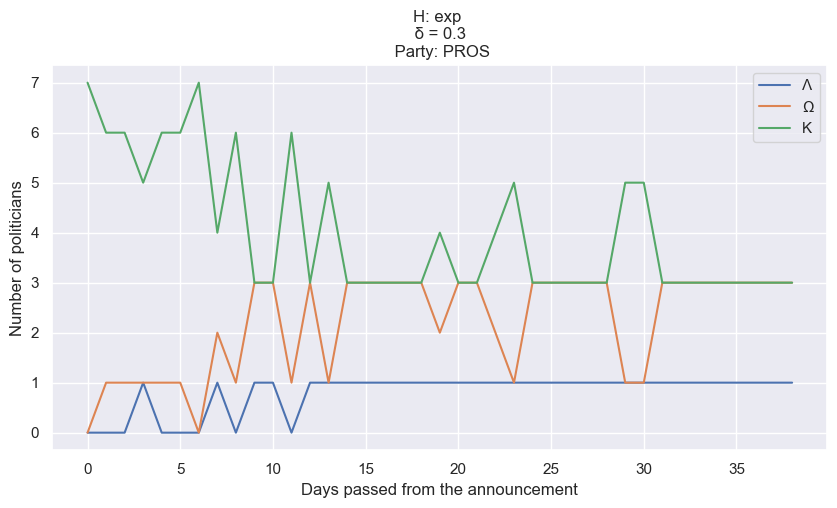

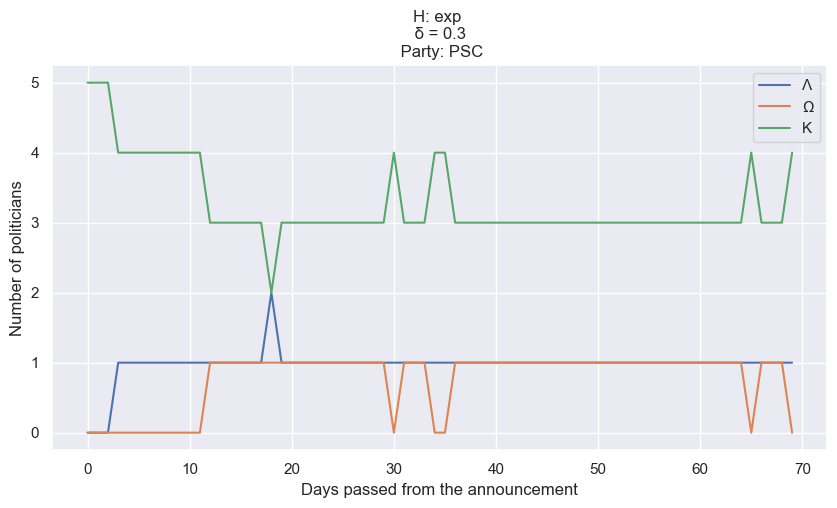

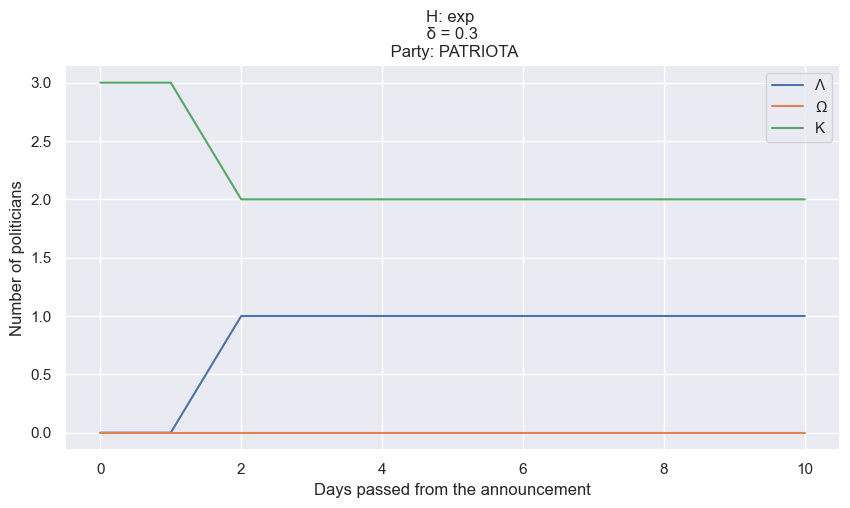

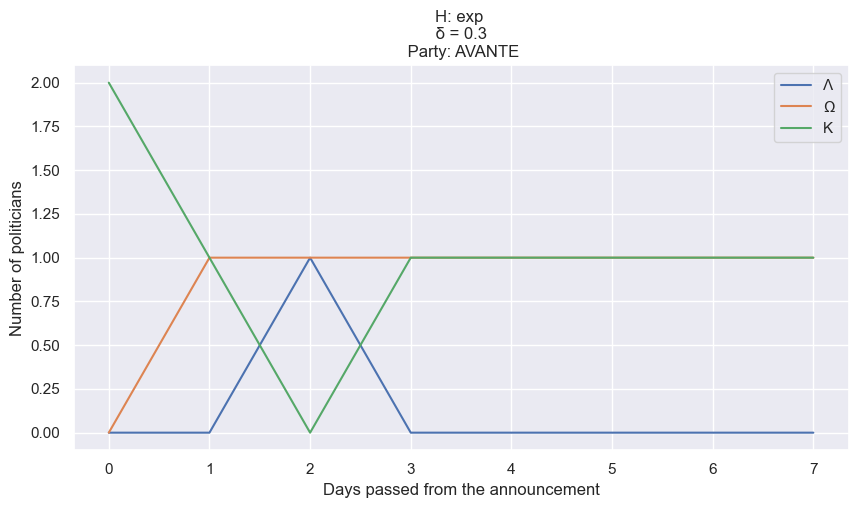

In [93]:
info_all = []
for partido_now in ['PL', 'PTB', 'MDB','PSD', 'DEM', 'PP', 'PROS','PROS','PSC','PATRIOTA', 'AVANTE']:
    for method in ['exp']:
        class Politico:
            pass
        info=[]
        for id_politico in data.id_politico.unique():
            data_now = data.copy().loc[data.id_politico==id_politico].set_index('time').iloc[:,2:]
            data_now = data_now[~data_now.index.duplicated(keep='first')]
            data_now = data_now.loc[data_now.nome_partido==partido_now]
            #data_now = data.copy().loc[data.nome_partido==partido_now]
            if len(data_now)==0:
                continue

            politico = Politico()

            politico.id = id_politico
            politico.taus = data_now.isFavorable
            politico.scores = [H(politico.taus[:i],method) for i in range(len(politico.taus))]
            info.append(politico)


        intm = [pd.DataFrame([0]+x.scores[1:],index = pd.to_datetime(x.taus.index.values),columns=[x.id]) for x in info]
        intm = [x.groupby(x.index.date).mean() for x in intm]
        if len(intm)==0:
                continue

        df_scores = pd.concat(intm,axis=1)
        df_scores.iloc[0] = 0
        df_scores = df_scores.fillna(method='ffill').sort_index()


        for delta in [0.3]:
            ax = classify(df_scores,delta).reset_index().iloc[:,1:].plot(figsize=(10,5),
                                                                         grid=True,
                                                                         title="H: %s \n δ = %s \n Party: %s"%(method,delta,partido_now))
            ax.set_xlabel("Days passed from the announcement")
            ax.set_ylabel("Number of politicians")
            info_all.append(classify(df_scores,delta))
            #filename = "H%sD%s - Partido %s.png" % (method,str(delta).replace('.',''),partido_now)
            #plt.savefig(os.path.join(r'images',filename))
            #print(filename)

In [109]:
df_intm = pd.concat(info_all,axis=1).fillna(method='ffill').fillna(0)
df_intm = df_intm.groupby(df_intm.columns,axis=1).sum()

<Axes: title={'center': 'H: exp \n δ = 0.3 \n CENTRÃO'}>

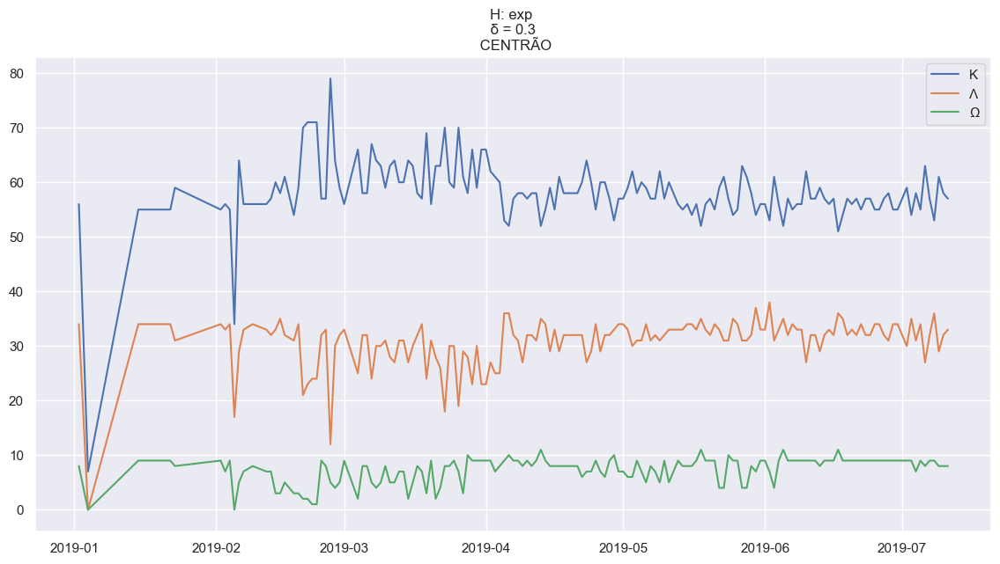

In [118]:
df_intm.plot(figsize=(14,7),
             title="H: %s \n δ = %s \n CENTRÃO"%(method,delta))

HexpD03 - Partido CENTRAO.png


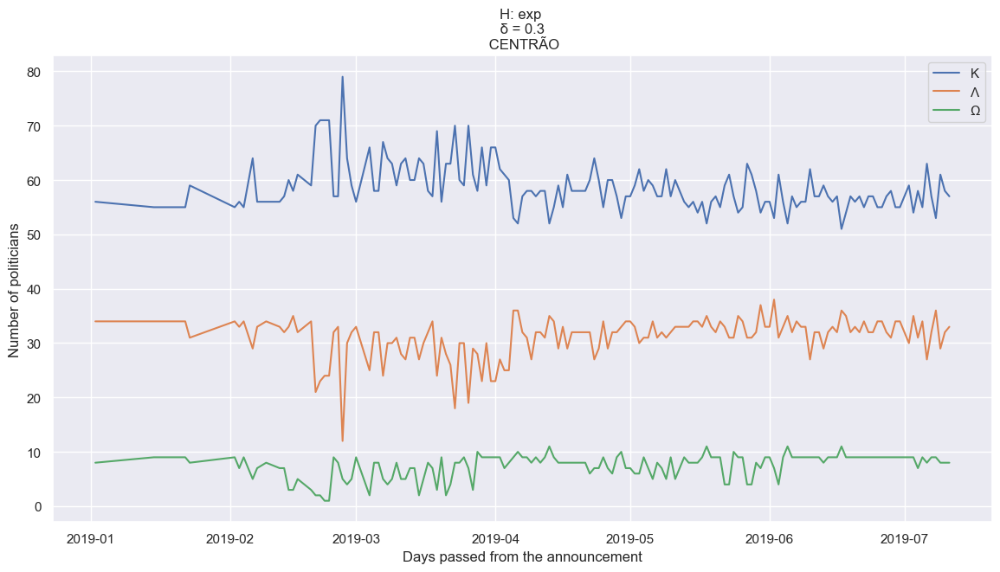

In [129]:
ax = df_intm.iloc[3:].plot(figsize=(14,7),
             title="H: %s \n δ = %s \n CENTRÃO"%(method,delta))

ax.set_xlabel("Days passed from the announcement")
ax.set_ylabel("Number of politicians")
filename = "H%sD%s - Partido %s.png" % (method,str(delta).replace('.',''),'CENTRAO')
plt.savefig(os.path.join(r'images',filename))
print(filename)

<Axes: title={'center': 'CENTRÃO'}>

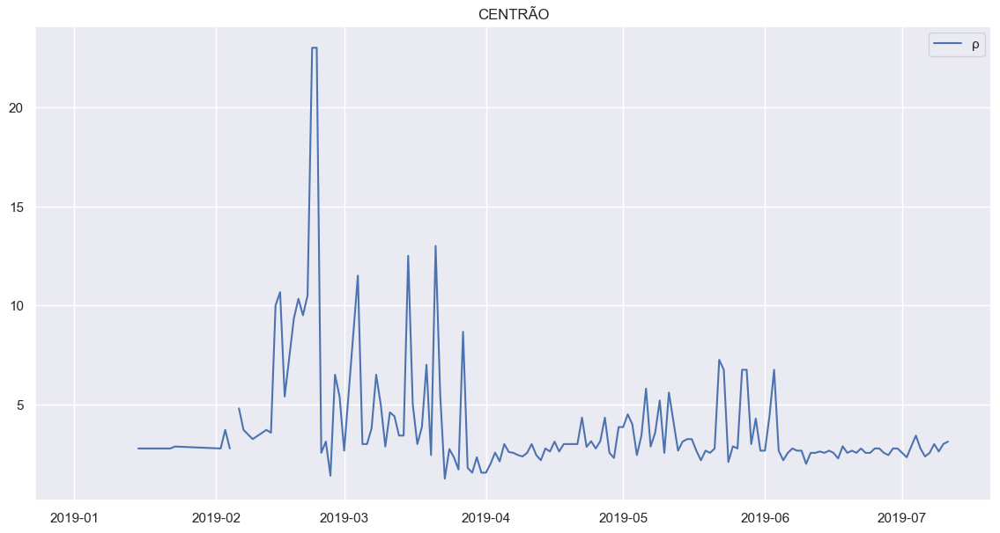

In [146]:
df_intm.iloc[:,[2,1]].T.pct_change().iloc[1:].T.rename(columns={'Λ':'ρ'}).plot(figsize=(14,7),
                                                                                                     title = 'CENTRÃO')

In [137]:
df_intm.rename()

,K,Λ,Ω
2019-01-04,7.0,0.0,0.0
2019-02-05,34.0,17.0,0.0
2019-02-18,54.0,31.0,3.0
2019-02-20,70.0,21.0,2.0
2019-03-04,66.0,25.0,2.0
...,...,...,...
2019-03-17,58.0,32.0,8.0
2019-04-28,57.0,32.0,9.0
2019-06-16,57.0,32.0,9.0
2019-07-07,57.0,32.0,9.0
